## Import Libraries

In [57]:
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn import manifold 

from scipy.cluster import hierarchy as sch

import plotly.graph_objs as go
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

## Import Dataset

In [58]:
dataFrame = pd.read_csv('Dataset_Cars.csv')
dataFrame.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014.0,450000.0,145500.0,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014.0,370000.0,120000.0,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,"Honda City 2017-2020 EXi,2006,158000,140000,Pe...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Hyundai i20 Sportz Diesel,2010.0,225000.0,127000.0,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,"Maruti Swift VXI BSIII,2007,130000,120000,Petr...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Data Preprocessing 

### Check for Missing values

In [59]:
df_Without_Names=dataFrame.iloc[:,1:]
dataFrame.iloc[:,1:].isnull().sum() #missing data count

year             341
selling_price    341
km_driven        341
fuel             341
seller_type      341
transmission     341
owner            341
mileage          562
engine           562
max_power        556
torque           563
seats            562
dtype: int64

### Find & Correct Anomalies

In [60]:
#Some data entries have info of 13 attributes in all in 'name' colums. This function will retrive this info and add to all 13 other colums

def Reformat_Miss_Entered_Data(ind,dataFrame):
    x=dataFrame.loc[ind, "name"]
    letter_list = x.split('"')  
    letter_list[1]= letter_list[1].replace(',', '')
    letter_list=letter_list[0] + letter_list[1] +letter_list[2]
    letter_list=letter_list.split(',')    
    #print(letter_list)
    dataFrame.loc[ind]=letter_list
    


df_with_only_NAN_rows=df_Without_Names[df_Without_Names.isna().any(axis=1)]
df_with_only_NAN_rows #smaller data frame with only NaN info

for ind  in df_with_only_NAN_rows.index: # iterating over df_with_only_NAN_rows to quick up the process 
    if df_Without_Names.iloc[ind].isnull().values.all(axis=0): # check if for ind all columns entries are NaN expect 'name' 
        Reformat_Miss_Entered_Data(ind,dataFrame)
        df_with_only_NAN_rows = df_with_only_NAN_rows.drop(ind) # delete cleansed data from NAN dataframe
        

In [61]:
dataFrame.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014.0,450000.0,145500.0,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014.0,370000.0,120000.0,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,12.7@ 2700(kgm@ rpm),5
3,Hyundai i20 Sportz Diesel,2010.0,225000.0,127000.0,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,11.5@ 4500(kgm@ rpm),5


In [62]:
dataFrame.isnull().sum()

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          221
engine           221
max_power        215
torque           222
seats            221
dtype: int64

### Remove Strings from floats (Units)

In [63]:
#removing units from data
dataFrame['mileage'] = dataFrame['mileage'].str.split(' ').str.get(0)
dataFrame['engine'] = dataFrame['engine'].str.split(' ').str.get(0)
dataFrame['max_power'] = dataFrame['max_power'].str.split(' ').str.get(0)

dataFrame_Attribute=dataFrame.drop(columns=['torque']) # torque and max-power are similar features so we can drop torque column
dataFrame_Attribute

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014.0,450000.0,145500.0,Diesel,Individual,Manual,First Owner,23.4,1248,74,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014.0,370000.0,120000.0,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7,1497,78,5
3,Hyundai i20 Sportz Diesel,2010.0,225000.0,127000.0,Diesel,Individual,Manual,First Owner,23.0,1396,90,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1,1298,88.2,5
...,...,...,...,...,...,...,...,...,...,...,...,...
8123,Hyundai i20 Magna,2013.0,320000.0,110000.0,Petrol,Individual,Manual,First Owner,18.5,1197,82.85,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8,1493,110,5
8125,Maruti Swift Dzire ZDi,2009.0,382000.0,120000.0,Diesel,Individual,Manual,First Owner,19.3,1248,73.9,5.0
8126,Tata Indigo CR4,2013.0,290000.0,25000.0,Diesel,Individual,Manual,First Owner,23.57,1396,70,5.0


### Observing and Removing Duplicates

In [64]:
duplicates = dataFrame_Attribute.duplicated()
dataFrame_Attribute[duplicates].sort_values('name')

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
7324,Audi Q3 2.0 TDI Quattro Premium Plus,2017.0,2825000.0,22000.0,Diesel,Dealer,Automatic,First Owner,15.73,1968,174.33,5.0
7775,Audi Q5 3.0 TDI Quattro,2014.0,1850000.0,76131.0,Diesel,Individual,Automatic,First Owner,13.22,2967,241.4,5.0
5245,Audi Q5 35TDI Premium Plus,2018.0,3975000.0,31800.0,Diesel,Dealer,Automatic,First Owner,17.01,1968,188,5.0
1561,Audi Q5 35TDI Premium Plus,2018.0,3975000.0,31800.0,Diesel,Dealer,Automatic,First Owner,17.01,1968,188,5.0
3236,Audi Q5 35TDI Premium Plus,2018.0,3975000.0,31800.0,Diesel,Dealer,Automatic,First Owner,17.01,1968,188,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1828,Volvo XC40 D4 Inscription BSIV,2019.0,3800000.0,20000.0,Diesel,Individual,Automatic,First Owner,18.0,1969,190,5.0
6693,Volvo XC40 D4 Inscription BSIV,2019.0,3800000.0,20000.0,Diesel,Individual,Automatic,First Owner,18.0,1969,190,5.0
4219,Volvo XC40 D4 Inscription BSIV,2019.0,3800000.0,20000.0,Diesel,Individual,Automatic,First Owner,18.0,1969,190,5.0
1100,Volvo XC40 D4 Inscription BSIV,2019.0,3800000.0,20000.0,Diesel,Individual,Automatic,First Owner,18.0,1969,190,5.0


In [65]:
dataFrame_Attribute.drop_duplicates(inplace=True)
dataFrame_Attribute

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014.0,450000.0,145500.0,Diesel,Individual,Manual,First Owner,23.4,1248,74,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014.0,370000.0,120000.0,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7,1497,78,5
3,Hyundai i20 Sportz Diesel,2010.0,225000.0,127000.0,Diesel,Individual,Manual,First Owner,23.0,1396,90,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1,1298,88.2,5
...,...,...,...,...,...,...,...,...,...,...,...,...
8121,Maruti Wagon R VXI BS IV with ABS,2013.0,260000.0,50000.0,Petrol,Individual,Manual,Second Owner,18.9,998,67.1,5.0
8122,Hyundai i20 Magna 1.4 CRDi,2014.0,475000.0,80000.0,Diesel,Individual,Manual,Second Owner,22.54,1396,88.73,5.0
8123,Hyundai i20 Magna,2013.0,320000.0,110000.0,Petrol,Individual,Manual,First Owner,18.5,1197,82.85,5.0
8124,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8,1493,110,5


### Filling missing data with dropna and/or interpolate

In [66]:
# we need to convert continuous data to numeric for clustring algo

dataFrame_Attribute['year'] = pd.to_numeric(dataFrame_Attribute['year'],errors='coerce')# convert string to numeric
dataFrame_Attribute['selling_price'] = pd.to_numeric(dataFrame_Attribute['selling_price'],errors='coerce')# convert string to numeric
dataFrame_Attribute['km_driven'] = pd.to_numeric(dataFrame_Attribute['km_driven'],errors='coerce')# convert string to numeric

dataFrame_Attribute['max_power'] = pd.to_numeric(dataFrame_Attribute['max_power'],errors='coerce')# convert string to numeric
dataFrame_Attribute['seats'] = pd.to_numeric(dataFrame_Attribute['seats'],errors='coerce')# convert string to numeric
dataFrame_Attribute['engine'] = pd.to_numeric(dataFrame_Attribute['engine'],errors='coerce')# convert string to numeric
dataFrame_Attribute['mileage'] = pd.to_numeric(dataFrame_Attribute['mileage'],errors='coerce')       

# Dropping NaN from both dataFrame
dataFrame_Attribute = dataFrame_Attribute.dropna(axis = 0, how ='any')
dataFrame=dataFrame.dropna(axis = 0, how ='any')
dataFrame_Attribute.fillna('',inplace=True)# if we ingor this some 1 NAN in max_power will be still there

dataFrame_Attribute = dataFrame_Attribute.reset_index(drop=True)
dataFrame_Analysis = dataFrame_Attribute.copy() #just saving a clean copy of given df for conducting analysis later
dataFrame_Attribute

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014.0,450000.0,145500.0,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014.0,370000.0,120000.0,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
2,Honda City 2017-2020 EXi,2006.0,158000.0,140000.0,Petrol,Individual,Manual,Third Owner,17.70,1497.0,78.00,5.0
3,Hyundai i20 Sportz Diesel,2010.0,225000.0,127000.0,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,5.0
4,Maruti Swift VXI BSIII,2007.0,130000.0,120000.0,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6712,Maruti Wagon R VXI BS IV with ABS,2013.0,260000.0,50000.0,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,5.0
6713,Hyundai i20 Magna 1.4 CRDi,2014.0,475000.0,80000.0,Diesel,Individual,Manual,Second Owner,22.54,1396.0,88.73,5.0
6714,Hyundai i20 Magna,2013.0,320000.0,110000.0,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,5.0
6715,Hyundai Verna CRDi SX,2007.0,135000.0,119000.0,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,5.0


In [67]:
dataFrame_Attribute.isnull().sum() # No missing data

name             0
year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
mileage          0
engine           0
max_power        0
seats            0
dtype: int64

### Encode Categorical Data

In [68]:
label_encoder = LabelEncoder()
dataFrame_Attribute[['fuel','seller_type','transmission','owner']] = dataFrame_Attribute[['fuel','seller_type','transmission','owner']].apply(LabelEncoder().fit_transform)

In [69]:
dataFrame_Attribute

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014.0,450000.0,145500.0,1,1,1,0,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014.0,370000.0,120000.0,1,1,1,2,21.14,1498.0,103.52,5.0
2,Honda City 2017-2020 EXi,2006.0,158000.0,140000.0,3,1,1,4,17.70,1497.0,78.00,5.0
3,Hyundai i20 Sportz Diesel,2010.0,225000.0,127000.0,1,1,1,0,23.00,1396.0,90.00,5.0
4,Maruti Swift VXI BSIII,2007.0,130000.0,120000.0,3,1,1,0,16.10,1298.0,88.20,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6712,Maruti Wagon R VXI BS IV with ABS,2013.0,260000.0,50000.0,3,1,1,2,18.90,998.0,67.10,5.0
6713,Hyundai i20 Magna 1.4 CRDi,2014.0,475000.0,80000.0,1,1,1,2,22.54,1396.0,88.73,5.0
6714,Hyundai i20 Magna,2013.0,320000.0,110000.0,3,1,1,0,18.50,1197.0,82.85,5.0
6715,Hyundai Verna CRDi SX,2007.0,135000.0,119000.0,1,1,1,1,16.80,1493.0,110.00,5.0


In [70]:
X = dataFrame_Attribute.iloc[:,1:]
X

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,2014.0,450000.0,145500.0,1,1,1,0,23.40,1248.0,74.00,5.0
1,2014.0,370000.0,120000.0,1,1,1,2,21.14,1498.0,103.52,5.0
2,2006.0,158000.0,140000.0,3,1,1,4,17.70,1497.0,78.00,5.0
3,2010.0,225000.0,127000.0,1,1,1,0,23.00,1396.0,90.00,5.0
4,2007.0,130000.0,120000.0,3,1,1,0,16.10,1298.0,88.20,5.0
...,...,...,...,...,...,...,...,...,...,...,...
6712,2013.0,260000.0,50000.0,3,1,1,2,18.90,998.0,67.10,5.0
6713,2014.0,475000.0,80000.0,1,1,1,2,22.54,1396.0,88.73,5.0
6714,2013.0,320000.0,110000.0,3,1,1,0,18.50,1197.0,82.85,5.0
6715,2007.0,135000.0,119000.0,1,1,1,1,16.80,1493.0,110.00,5.0


## Clustering Algorithm: K-Means

#### Elbow Method - Calculate "Within-Cluster-Sum-of-Squares" 

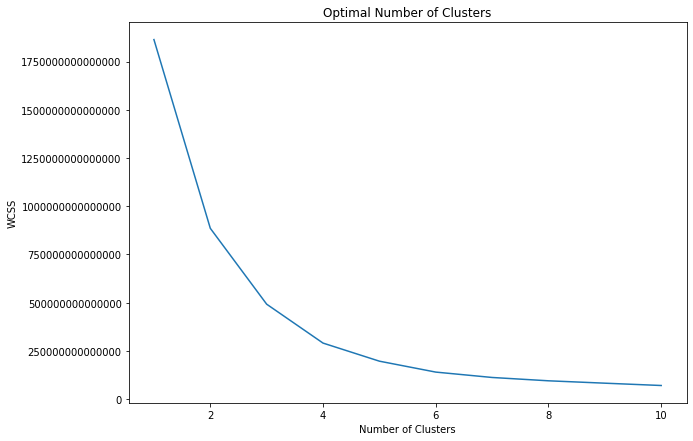

In [71]:
plt.figure(figsize=(10, 7))
wcss = [] 
for i in range(1,11):
    kmeans = KMeans(n_clusters = i,init ='k-means++', random_state =42) #'k-means++' is to avoid random initialization trap
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.title("Optimal Number of Clusters")
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.ticklabel_format(style='plain', axis='y')
plt.show()

## Train K-Means

In [72]:
kmeans = KMeans(n_clusters = 2,init ='k-means++', random_state =42)
y_kmeans = kmeans.fit_predict(X)

In [73]:
K_centroids = kmeans.cluster_centers_ #centroids
K_centroids

array([[2.01349490e+03, 4.52451769e+05, 7.44702272e+04, 1.90732159e+00,
        9.17052827e-01, 9.36824220e-01, 8.99289466e-01, 1.96305854e+01,
        1.39799907e+03, 8.44306186e+01, 5.41875193e+00],
       [2.01670782e+03, 2.49613988e+06, 4.48410823e+04, 1.23045267e+00,
        5.80246914e-01, 3.16872428e-01, 3.95061728e-01, 1.50972840e+01,
        2.30981893e+03, 1.76629918e+02, 5.84773663e+00]])

In [74]:
dataFrame_Attribute['k_means_clusters'] = y_kmeans
dataFrame_Analysis['k_means_clusters'] = y_kmeans

In [75]:
dataFrame_Attribute.head(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,k_means_clusters
0,Maruti Swift Dzire VDI,2014.0,450000.0,145500.0,1,1,1,0,23.40,1248.0,74.00,5.0,0
1,Skoda Rapid 1.5 TDI Ambition,2014.0,370000.0,120000.0,1,1,1,2,21.14,1498.0,103.52,5.0,0
2,Honda City 2017-2020 EXi,2006.0,158000.0,140000.0,3,1,1,4,17.70,1497.0,78.00,5.0,0
3,Hyundai i20 Sportz Diesel,2010.0,225000.0,127000.0,1,1,1,0,23.00,1396.0,90.00,5.0,0
4,Maruti Swift VXI BSIII,2007.0,130000.0,120000.0,3,1,1,0,16.10,1298.0,88.20,5.0,0
5,Hyundai Xcent 1.2 VTVT E Plus,2017.0,440000.0,45000.0,3,1,1,0,20.14,1197.0,81.86,5.0,0
6,Maruti Wagon R LXI DUO BSIII,2007.0,96000.0,175000.0,2,1,1,0,17.30,1061.0,57.50,5.0,0
7,Maruti 800 DX BSII,2001.0,45000.0,5000.0,3,1,1,2,16.10,796.0,37.00,4.0,0
8,Toyota Etios VXD,2011.0,350000.0,90000.0,1,1,1,0,23.59,1364.0,67.10,5.0,0
9,Ford Figo Diesel Celebration Edition,2013.0,200000.0,169000.0,1,1,1,0,20.00,1399.0,68.10,5.0,0


### Cluster Visualizations - Interactive Charts

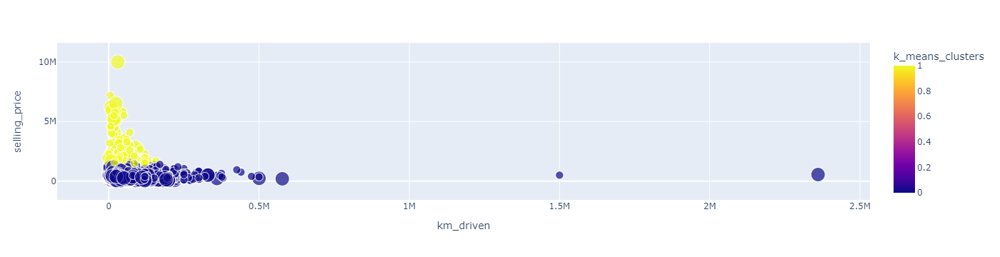

In [76]:
fig = px.scatter(dataFrame_Attribute, x='km_driven', y='selling_price', color='k_means_clusters', size='fuel', hover_name='name')
fig.show()

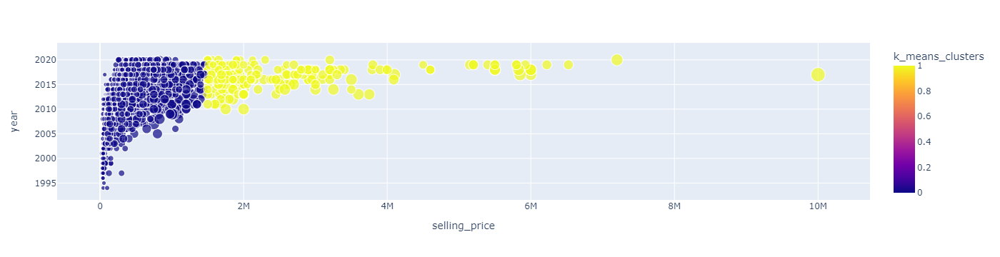

In [77]:
fig = px.scatter(dataFrame_Attribute, x='selling_price', y='year', size='max_power', 
                 hover_name='name', color='k_means_clusters')
fig.show()

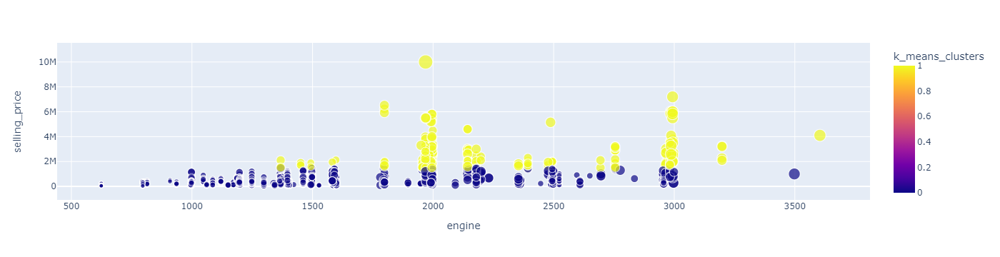

In [78]:
fig = px.scatter(dataFrame_Attribute, y='selling_price', x='engine',size='max_power', color='k_means_clusters')
fig.show()


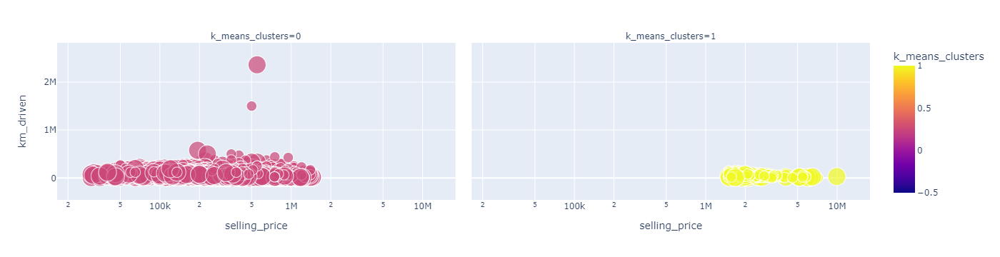

In [79]:
fig = px.scatter(dataFrame_Attribute, x='selling_price', y='km_driven', color='k_means_clusters', size='fuel', size_max=25, 
                 hover_name='name', facet_col='k_means_clusters', log_x=True)
fig.show()

## Clusters Analysis

### Adding Companies Info into Data Frame

In [80]:
 # splitting at occurrence of whitespace
dataFrame_Analysis.insert(1,'company',dataFrame_Analysis["name"].str.split(" ", 1).str.get(0))

In [81]:
df_col_merged = dataFrame_Analysis.copy()
df_col_merged.head(3)

,name,company,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,k_means_clusters
0,Maruti Swift Dzire VDI,Maruti,2014.0,450000.0,145500.0,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0,0
1,Skoda Rapid 1.5 TDI Ambition,Skoda,2014.0,370000.0,120000.0,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0,0
2,Honda City 2017-2020 EXi,Honda,2006.0,158000.0,140000.0,Petrol,Individual,Manual,Third Owner,17.70,1497.0,78.00,5.0,0


### Cluster 0 : Very Stable Market Trend : e.g. Mahindra Cars

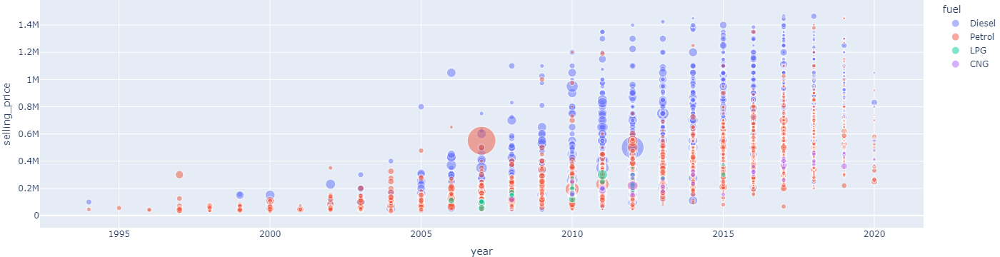

In [82]:
fig = px.scatter( dataFrame_Analysis[dataFrame_Analysis['k_means_clusters']==0], x='year', y ='selling_price', color='fuel', 
                 size='km_driven', size_max=40, hover_data=['name','year','selling_price'], opacity=0.5)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

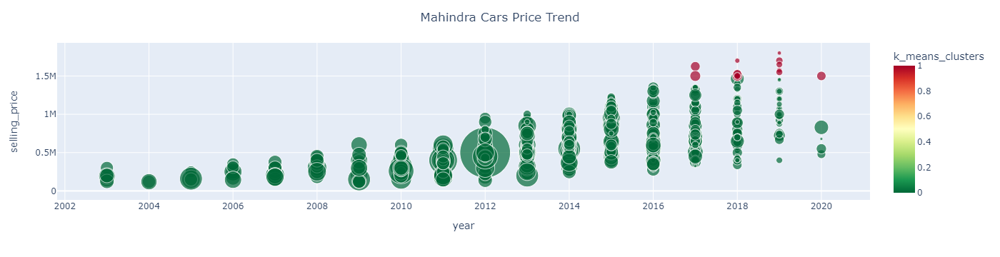

In [83]:
fig = px.scatter( dataFrame_Analysis[dataFrame_Analysis['company']=='Mahindra'], x='year', y ='selling_price', color='k_means_clusters',
                 color_continuous_scale=px.colors.diverging.RdYlGn[::-1], size='km_driven', size_max=50,
                 hover_data=['name','year','selling_price'], opacity=0.7)
fig.update_layout(
    title={
        'text': "Mahindra Cars Price Trend",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

### Cluster 1 : Sharp price depreciation over the years : e.g. Audi

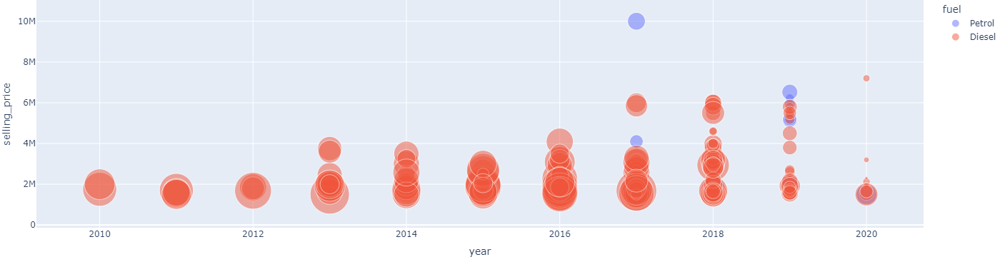

In [84]:
fig = px.scatter( dataFrame_Analysis[dataFrame_Analysis['k_means_clusters']==1], x='year', y ='selling_price', color='fuel', 
                 size='km_driven', size_max=40, hover_data=['name','year','selling_price'], opacity=0.5)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

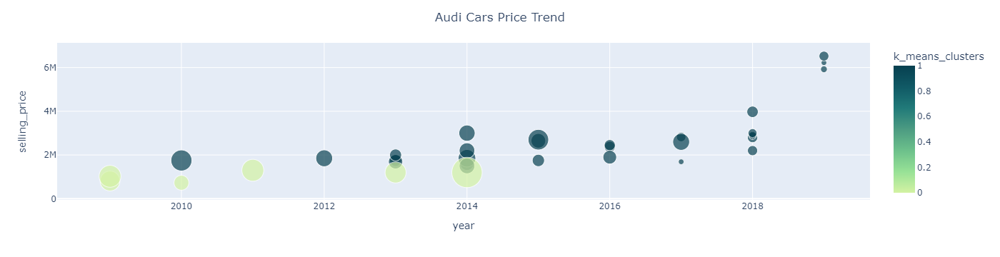

In [85]:
fig = px.scatter( dataFrame_Analysis[dataFrame_Analysis['company']=='Audi'], x='year', y ='selling_price', color='k_means_clusters', 
                 size='km_driven', size_max=30, hover_data=['name','year','selling_price'], 
                 color_continuous_scale='emrld' , opacity=0.7)
fig.update_layout(
    title={
        'text': "Audi Cars Price Trend",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

### Market Share : Cluster 0 is dominent

/usr/local/lib/python3.8/dist-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/usr/local/lib/python3.8/dist-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/usr/local/lib/python3.8/dist-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



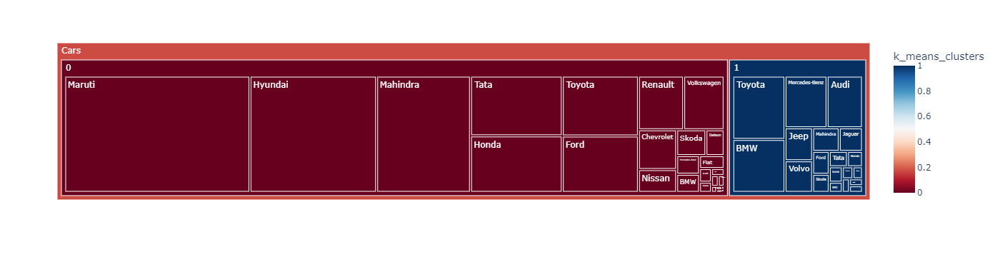

In [86]:
fig = px.treemap(dataFrame_Analysis, path=[px.Constant('Cars'),'k_means_clusters', 'company'], values='selling_price', 
                 color='k_means_clusters', color_continuous_scale='RdBu',
                 hover_data=['name','year','km_driven'])
fig.show()

### Most Expensive Car Companies : Most of them are in Cluster 1

In [87]:
df_col_merged['selling_price'].min()

29999.0

In [88]:
np.median(df_col_merged['selling_price'])

420000.0

/usr/local/lib/python3.8/dist-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/usr/local/lib/python3.8/dist-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/usr/local/lib/python3.8/dist-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



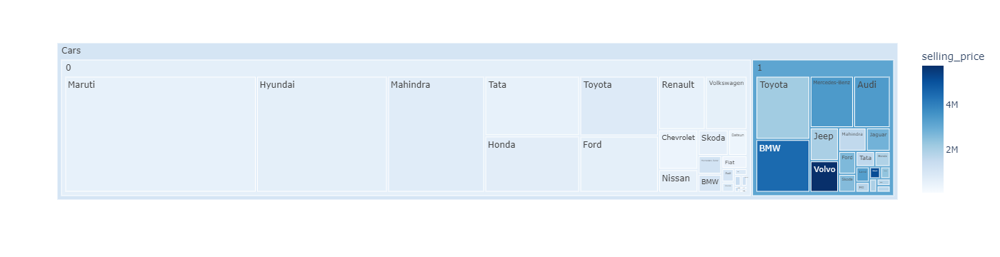

In [89]:
fig = px.treemap(dataFrame_Analysis, path=[px.Constant('Cars'),'k_means_clusters', 'company'], values='selling_price', 
                 color='selling_price', color_continuous_scale='blues',
                 hover_data=['name','year','km_driven'])
fig.show()

### Market Share of Car's Fuel Type : Same trend in both Clusters : Diesel on Top

/usr/local/lib/python3.8/dist-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/usr/local/lib/python3.8/dist-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/usr/local/lib/python3.8/dist-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/usr/local/lib/python3.8/dist-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



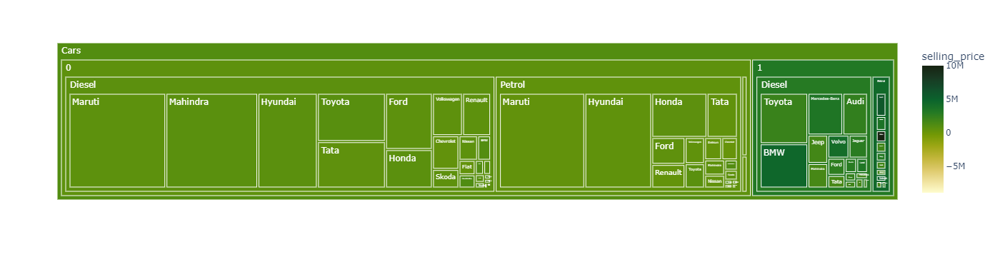

In [90]:
fig = px.treemap(dataFrame_Analysis, path=[px.Constant('Cars'), 'k_means_clusters','fuel','company'], values='selling_price', 
                 color='selling_price', color_continuous_scale='speed',
                 color_continuous_midpoint=np.average(df_col_merged['selling_price']),
                 hover_data=['name','year','km_driven'])
fig.show()

### Mileage vs Max-Power : Same trend in both Clusters : Mileage decreases when Power increases

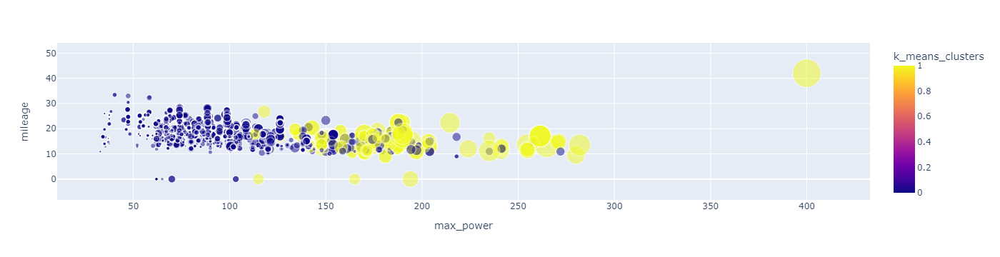

In [91]:
fig = px.scatter( dataFrame_Analysis, x ='max_power', y ='mileage', color='k_means_clusters', 
                 size='selling_price', size_max=40, hover_data=['name','year','selling_price'], opacity=0.5)
fig.show()

### No. of Seats Trend over the Years : Lesser seats generates more profit (very few with 6)

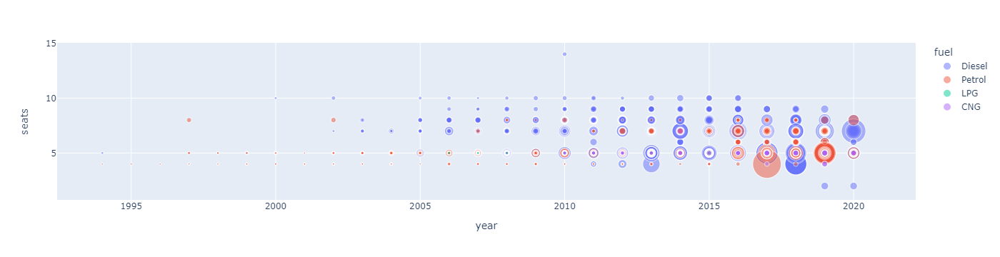

In [92]:
fig = px.scatter( dataFrame_Analysis, x ='year', y ='seats', color='fuel', 
                 size='selling_price', size_max=40, hover_data=['name','year','selling_price'], opacity=0.5)
fig.show()

In [93]:
# fig = px.scatter( dataFrame_Analysis, x ='km_driven', y ='selling_price', color='k_means_clusters', 
#                  size='selling_price', size_max=40, hover_data=['name','year','selling_price'], opacity=0.5)
# fig.show()

In [94]:
fig = px.scatter_3d( dataFrame_Analysis, x ='engine', y ='max_power', z= 'year', color='k_means_clusters', 
                    size='selling_price', color_continuous_scale='rdbu',
                    size_max=40, hover_data=['name','year','selling_price'], opacity=1)
fig.show()